## Introduction (20 points)

Hypothesis: If HIV-2 binds less efficiently to the CD4 cell receptors compared to HIV-1, then the HIV-1 and the CD4 cell surface have better protein-protein interaction compared to HIV-2 and the CD4 cell surface.



Question: Why does HIV-1 bind more efficiently to the CD4 cell surface compared to HIV-2?



Backround: There are many strains and 2 main  types of HIV. There are HIV-1 and HIV-2. HIV-1 is the type that the majority of people have, and is known to be more transmissible with a quicker decline in health. On the other hand, there are fewer people living with HIV-2, it is less transmissible, and the decline in health is slower. So why is HIV-1 more transmissable with worse symptoms than HIV-2? It could possibly be due to differences in the receptors to the CD4 T cells. The CD4 T cells are white helper cells that look for foreign bodies that can get people sick. HIV infects these CD4 T cells by binding and fusing to the cell with proteins on HIV cell surface called gp120 and gp41.The gp120 structure of HIV-1 and HIV-2 are actually similar in structure although their sequences look very different (Davenport). So I am going to investigate the gp41 protein in this project, because a possible structural diffrence in this protein could be the cause of the differences in symptoms and transmissability of the two kinds of HIV. The fasta files were sourced from NCBI website and the PDB files were sourced from RCSB website.

- 5 points for description of what analyses were done and how the data was downloaded for the project

.pdb files from Unitprot and sequences from NCBI wedsite and on the READme of the github. ADD MORE

## Loading in Packages (15 points)
- 10 points for definition of each of the packages loaded 

Seen in the chunk below, above each code for importation is a description of the packages.

- 5 points for correctly loading all of the packages needed and stating anything that needs to be done to load the packages (downloading the packages)

Links to websites helping installation of packages on the main commandline are linked below, above the package being imported.

In [69]:
# The import below is going to give me functions so that I can do pariwise sequencing.
# Go to https://biopython.org/wiki/Getting_Started to get the commands to install biopython which is where this package is from.
from Bio import pairwise2
# The import below is going to be able to give me the functions to visualize a protein from a pDB file.
# Go to https://github.com/nglviewer/nglview to get the commands to install nglview.
import nglview
# The import below allows us to work with files that are sequences of DNA or RNA
# Go to to https://biopython.org/wiki/Getting_Started get the commands to install SeqIO
from Bio import AlignIO
# The import below will allow us to align different sequences and comapare them. 
# Biopython must be installed for this module to be used.
from Bio import pairwise2
# Numpy is a commonly used package in python that allows data to be organized in an array. The package also lets us manipulate data.
# install numpy using commands on: https://numpy.org/install/
import numpy as np
# Pylab is going to be necesary to create the dot plot. It is similar to matplotlib in that it creates graphs. 
# install pylab using commands on: https://pypi.org/project/pylab-sdk/
import pylab
# Matplotlib allows us to graph things in this project.
# Instructions on installing matplotlib: https://matplotlib.org/stable/users/installing/index.html
import matplotlib.pyplot as plt
# Bio.PDB allows us to work with PDB files so in this case we can visualize proteins and do protein measurements.
# Install Biopython to use bio.pdb
import Bio.PDB

## Performing Bioinformatics Analysis (20 points)

The code in the 2 cells below is from: https://stackoverflow.com/questions/58673944/get-all-bounds-lengths-from-pdb. 
This code measures the lengths of the bounds in the pdb files which is the lengths between atoms. This is a type of protein measurement, that useful to compare the distances of the atoms.This can tell us where differences may lie that account for HIV-1 binding to CD4 cell surface compared to HIV-2.

In [60]:
# the variables in the 4 lines of code are all global as they are not in a for loop
parser = Bio.PDB.PDBParser(QUIET=True)
# this is reading the pdb file
structures = parser.get_structure('5cay', '5cay.pdb')
structure = structures[0]
atom_list = [_ for _ in structure.get_atoms()]

# bio.PDB.neighborsearch is a module that will look up neighboring atoms using a KD tree
# the variables below are both global as they are not included in for loops
ns = Bio.PDB.NeighborSearch(atom_list)
_cutoff_dist = 5

# create a for loop so we can efficiently go through all of the different atoms distances in the protein
for target in atom_list:
    #the variable below is a local variable as it is in a for loop
  close_atoms = ns.search(target.coord, _cutoff_dist)
  for close_atom in close_atoms:
    print(target, close_atom, target - close_atom)
  print ("==========")

<Atom N> <Atom CB> 2.3601444
<Atom N> <Atom CG> 2.3507383
<Atom N> <Atom CA> 1.470686
<Atom N> <Atom CD> 1.4771208
<Atom N> <Atom N> 0.0
<Atom N> <Atom CG> 4.4193063
<Atom N> <Atom OE1> 4.7890167
<Atom N> <Atom N> 3.452472
<Atom N> <Atom C> 2.5085132
<Atom N> <Atom O> 3.04661
<Atom N> <Atom CB> 4.7920384
<Atom N> <Atom CA> 4.696067
<Atom CA> <Atom CB> 1.5367815
<Atom CA> <Atom CG> 2.4089494
<Atom CA> <Atom CA> 0.0
<Atom CA> <Atom CD> 2.4523926
<Atom CA> <Atom N> 1.470686
<Atom CA> <Atom CG> 4.9205
<Atom CA> <Atom CD> 4.5615478
<Atom CA> <Atom OE1> 3.6819713
<Atom CA> <Atom N> 2.437744
<Atom CA> <Atom C> 1.5357283
<Atom CA> <Atom CD1> 4.94053
<Atom CA> <Atom O> 2.4085453
<Atom CA> <Atom NE2> 4.6178355
<Atom CA> <Atom O> 4.7674937
<Atom CA> <Atom C> 4.571673
<Atom CA> <Atom CA> 3.826217
<Atom CA> <Atom CB> 4.8588243
<Atom CA> <Atom CG> 4.9534664
<Atom C> <Atom CB> 2.5392616
<Atom C> <Atom CG> 3.2913475
<Atom C> <Atom CA> 1.5357283
<Atom C> <Atom CD> 3.4435518
<Atom C> <Atom N> 2.5085132


In [61]:
parser = Bio.PDB.PDBParser(QUIET=True)
structures = parser.get_structure('3tih', '3tih.pdb')
structure = structures[0]
atom_list = [_ for _ in structure.get_atoms()]

ns = Bio.PDB.NeighborSearch(atom_list)
_cutoff_dist = 5

for target in atom_list:
  close_atoms = ns.search(target.coord, _cutoff_dist)
  for close_atom in close_atoms:
    print(target, close_atom, target - close_atom)
  print ("==========")

<Atom N> <Atom N> 4.074052
<Atom N> <Atom CA> 4.1103888
<Atom N> <Atom C> 3.7004788
<Atom N> <Atom N> 4.8814034
<Atom N> <Atom O> 2.6560133
<Atom N> <Atom N> 0.0
<Atom N> <Atom CG2> 2.9811652
<Atom N> <Atom CB> 2.481398
<Atom N> <Atom CG2> 4.85792
<Atom N> <Atom CZ3> 4.2604313
<Atom N> <Atom CB> 3.8877661
<Atom N> <Atom CE3> 3.8807425
<Atom N> <Atom OG1> 2.6206079
<Atom N> <Atom CD2> 4.910916
<Atom N> <Atom CA> 1.4585265
<Atom N> <Atom C> 2.4529502
<Atom N> <Atom N> 3.5336034
<Atom N> <Atom O> 2.8341982
<Atom N> <Atom CA> 4.774489
<Atom N> <Atom CG1> 3.8113918
<Atom CA> <Atom O> 3.9402015
<Atom CA> <Atom N> 1.4585265
<Atom CA> <Atom CG2> 2.5147867
<Atom CA> <Atom CB> 1.5399573
<Atom CA> <Atom CZ3> 4.4115095
<Atom CA> <Atom CE3> 3.800541
<Atom CA> <Atom OG1> 3.651748
<Atom CA> <Atom CD2> 4.4688916
<Atom CA> <Atom CG> 4.8256607
<Atom CA> <Atom CB> 4.5800457
<Atom CA> <Atom CA> 0.0
<Atom CA> <Atom C> 1.5254456
<Atom CA> <Atom N> 2.4246013
<Atom CA> <Atom O> 2.400117
<Atom CA> <Atom CA> 3.

Pairwise sequence alignment between the genomes of HIV-1 and HIV-2. This will show where there are differences in the genome that could account for the differences in efficiency in binding to CD4 T cells. I was originally going to focus on the env gene especially looking at the gp120 protein but now I think I will focus on the gp41 protein after reading one of my papers. One of the papers suggested that the gp120 protein looks structurally similar between the two types of HIV, so I will focus on the fusing receptor. This protein is also coded by the env gene and is also important for the virus to bind to the CD4 T cell. We will use a dot plot to visualize this comparison between the two sequences.

The data type used in this method will be fasta files read by AlignIO.

In [62]:
# the line below is what aligns the sequences
alignments = pairwise2.align.globalxx("GGTCTCTCTGGTTAGACCAGATCTGAGCCTGGGAGCTCTCTGGCTAACTAGGGAACCCACTGCTTAAGCCTCAATAAAGCTTGCCTTGAGTGCTTCAAGTAGTGTGTGCCCGTCTGTTGTGTGACTCTGGTAACTAGAGATCCCTCAGACCCTTTTAGTCAGTGTGGAAAATCTCTAGCAGTGGCGCCCGAACAGGGACCTGAAAGCGAAAGGGAAACCAGAGGAGCTCTCTCGACGCAGGACTCGGCTTGCTGAAGCGCGCACGGCAAGAGGCGAGGGGCGGCGACTGGTGAGTACGCCAAAAATTTTGACTAGCGGAGGCTAGAAGGAGAGAGATGGGTGCGAGAGCGTCAGTATTAAGCGGGGGAGAATTAGATCGATGGGAAAAAATTCGGTTAAGGCCAGGGGGAAAGAAAAAATATAAATTAAAACATATAGTATGGGCAAGCAGGGAGCTAGAACGATTCGCAGTTAATCCTGGCCTGTTAGAAACATCAGAAGGCTGTAGACAAATACTGGGACAGCTACAACCATCCCTTCAGACAGGATCAGAAGAACTTAGATCATTATATAATACAGTAGCAACCCTCTATTGTGTGCATCAAAGGATAGAGATAAAAGACACCAAGGAAGCTTTAGACAAGATAGAGGAAGAGCAAAACAAAAGTAAGAAAAAAGCACAGCAAGCAGCAGCTGACACAGGACACAGCAATCAGGTCAGCCAAAATTACCCTATAGTGCAGAACATCCAGGGGCAAATGGTACATCAGGCCATATCACCTAGAACTTTAAATGCATGGGTAAAAGTAGTAGAAGAGAAGGCTTTCAGCCCAGAAGTGATACCCATGTTTTCAGCATTATCAGAAGGAGCCACCCCACAAGATTTAAACACCATGCTAAACACAGTGGGGGGACATCAAGCAGCCATGCAAATGTTAAAAGAGACCATCAATGAGGAAGCTGCAGAATGGGATAGAGTGCATCCAGTGCATGCAGGGCCTATTGCACCAGGCCAGATGAGAGAACCAAGGGGAAGTGACATAGCAGGAACTACTAGTACCCTTCAGGAACAAATAGGATGGATGACAAATAATCCACCTATCCCAGTAGGAGAAATTTATAAAAGATGGATAATCCTGGGATTAAATAAAATAGTAAGAATGTATAGCCCTACCAGCATTCTGGACATAAGACAAGGACCAAAGGAACCCTTTAGAGACTATGTAGACCGGTTCTATAAAACTCTAAGAGCCGAGCAAGCTTCACAGGAGGTAAAAAATTGGATGACAGAAACCTTGTTGGTCCAAAATGCGAACCCAGATTGTAAGAC", 
"AGTCGCTCTGCGGAGAGGCTGGCAGATTGAGCCCTGGGAGGTTCTCTCCAGCACTAGCAGGTAGAGCCTGGGTGTTCCCTGCTAGACTCTCACCAGTGCTTGGCCGGCACTGGGCAGACGGCTCCACGCTTGCTTGCTTAAAGACCTCTTAATAAAGCTGCCAGTTAGAAGCAAGTTAAGTGTGTGTTCCCATCTCTCCTAGTCGCCGCCTGGTCATTCGGTGTTCATCTGAGTAACAAGACCCTGGTCTGTTAGGACCCTTCCCGCTTTGAGAATCCAAGGCAGGAAAATCCCTAGCAGGTTGGCGCCCGAACAGGGACTTGAAAGAGGACTGAGAAGCCCTGGAACACGGCTGAGTGAAGGCAGTAAGGGCGGCAGGAACAAACCACGACGGAGTGCTCCTAGAAAAGCGCGGGCCGAGGTACCGAAGCGGCGTGTGGAGCGGGAGTGAAAGAGGCCTCCGGGTGAAGGTAAGTACCTACACCGAAAACTGTAGCCAGAAAAGGCTTGTTATCCTACCTTTAGACAGGTAGAAGATTGTGGGAGATGGGCGCGAGAAACTCCGTCTTGAGAGGGAAAAAAGCAGACGAATTAGAAAAAGTTAGGTTACGGCCCAACGGAAAGAAAAGATACAGGTTAAAACATGTTGTGTGGGCAGCGAATGAATTAGACAGATTCGGATTGGCAGAGAGCCTGTTGGAATCAAAAGAAGGTTGCCAAAAGATTCTTAAAGTTTTAGAACCATTAGTACCAACAGGGTCAGAAAATTTAAAAAGCCTTTTTAATACCGTCTGCGTCATTTGGTGCTTGCACGCAGAAGAGAAAGTGAAAGATACTGAAGAAGCAAAGAAACTAGCACAGAGACATCTAGTGGCAGAAACAGGAACTGCAGAGAAAATGCCAAATATAAGTAGACCAACAGCACCACCTAGTGGGAAAGGAGGAAACTTCCCCGTGCAACAGGCAGGCGGCAACTATATCCATGTGCCGCTGAGCCCCCGAACTCTAAATGCTTGGGTAAAATTAGTAGAGGAAAAGAAGTTCGGGGCA")

print(alignments)

[Alignment(seqA='G-GTC--TCT-C--------TGG----TT-AG-------A----C-C---AG-A-T--C---T-GAGCCTGGGA-GCTCTC--TG---G-CT---A--A---CT--------A--GGG-A-AC--C-C-AC--T-GCTT----AA-G-CCTC--AATAAAGCTTGCC--TTGAGT--GCTTCAAGT-A-GTGTGTG--CCCG-TCTG-T--T-GT-G-----TG---A--C--T---C-T--G-GTAACTAGAGATCCCT---C----AG-ACCCTT-----TT--AG--TC-A-GTGT--GGAAAATCTC-TAGCAG-T-GGCGCCCGAACAGGGACCT-GAAAGCGAAAGGGAAACCA-GAGGA-GCTCTCTCGACGCAGGACT-CGGCTTGCTGAAGCGC-GCAC-GGCAAG-AGGCGAGGGGCGGCGACTGGTGAGTACGCCAAAAATTTTGACT-A-G-CGGAG-GCT---AGAAGGAGAGAGAT-G-GGTGCGA-GAGCGTCA--GTATTAAGCGG-G-G-GAGAATTAGATCGATGGGAAA---AAATTCGGTTAAGGCCAG---GGG-GAAAGAAAA--AA-TA--TAA-ATT---AAAACATATAGTATGGGCAAGCAGGGAGCTAGAACGATTCGCA--GTTAATCCTGG-CCTGTTAGAAACA--TCAGAAGGC-T-GTAGACAA--AT-ACTGGGACAGCT-AC-AACCA-TCC--CTTCAGAC-AGG-ATCAGAAGAA-CTTAGATC-A-TTAT-ATAATACAGT-AGCAACCC-TCTATTGT-GTGCATCA-AA-GGATAGAGATAAAAGAC-ACCAAGGAAGCTTTAGACAAG-ATAGA--G-GAA-GAG-CAAAA-CAAAAGTAA-GAAAAA--AGCACAGCAAGCAG--CAGCTGACACA--GGACACAGCAATCAGGTCAGCCAAAAT-TACCCT--ATAGTGCAGAACATCCAGGGGCAAATGG

## Plotting The Results (15 points)
- 5 points for description of data analysis method

A dot plot is used to analyze the data. A dot plot visualizes the similarities between two sequences, either protein sequences or DNA/RNA sequences. In this case we are comparing the sequences between the two HIV1 and HIV2 gp41 genes to see the similarities and differences between the two sequences.

Homology modeling of the HIV-1 and HIV-2 type. This will predict the 3D structure of our virus/the gene we are focusing on. Protein structure tends to be conserved, so this will give us a visual if these are only really different on the sequence level, or if they have evolved to have proteins that appear different. Again I will be focusing on the gp41 protein and how the proteins structurally appear to be different/similar. 

The data type used in this method will be PDB files from RCSB. I will be using the nglVIEW package to model the proteins for visualization.

- 5 points for the code working for data analysis method

Seen below.

- 5 points for adequate commenting in the code for the data analysis method

Comments made above lines of code below.

In [63]:
view = nglview.show_pdbid("5cay")  # load "5cay" from RCSB PDB and display viewer widget
view.add_representation('licorice', selection='chain A') # this line is essential to actually view the structure
view

NGLWidget()

In [64]:
view = nglview.show_pdbid("3tih")  # load "3tih" from RCSB PDB and display viewer widget
view.add_representation('licorice', selection='chain A') # this line is essential to actually view the structure
view 

NGLWidget()

In [65]:
# read in our fasta file and create a global variable "hiv1" to be later used to create our dotplot
hiv1 = SeqIO.read("hiv1.fasta", "fasta")
# print out the global variable to make sure it read through
print(hiv1)

ID: NC_001802.1
Name: NC_001802.1
Description: NC_001802.1 Human immunodeficiency virus 1, complete genome
Number of features: 0
Seq('GGTCTCTCTGGTTAGACCAGATCTGAGCCTGGGAGCTCTCTGGCTAACTAGGGA...TTC')


In [66]:
# read in our fasta file and create a global variable "hiv2" to be later used to create our dotplot
hiv2 = SeqIO.read("hiv2_sequence.fasta", "fasta")
# print out the global variable to make sure it read through
print(hiv2)

ID: J04542.1
Name: J04542.1
Description: J04542.1 Human immunodeficiency virus type 2 (HIV-2), complete proviral genome
Number of features: 0
Seq('AGTCGCTCTGCGGAGAGGCTGGCAGATTGAGCCCTGGGAGGTTCTCTCCAGCAC...TTC')


In [67]:
# Setting the window size and which sequence is on the x and y axes of the dot plot
window = 3
seq_one = str(record)
#print(seq_one)
seq_two = str(hi)
#print(seq_two)
# Saving the data in the dot plot based on window size and comparing for all I and all j in the range of the lengths of the
# sequences, wheter or not there is an alignment.

data = [
    [
        (seq_one[i : i + window] != seq_two[j: j + window])
        for j in range(len(seq_one) - window)
    ]
    for i in range(len(seq_two) - window)
]

print(data)

[[False, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, T

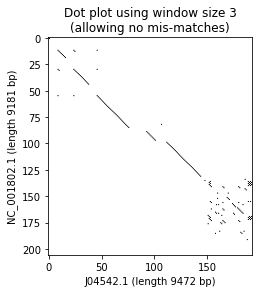

In [68]:
pylab.gray()
pylab.imshow(data)
# labeling the x axis
pylab.xlabel("%s (length %i bp)" % (hiv2.id, len(hiv2)))
# labeling the y axis
pylab.ylabel("%s (length %i bp)" % (hiv1.id, len(hiv1)))
# titles the plot
pylab.title("Dot plot using window size %i\n(allowing no mis-matches)" % window)
# visualizes the plot
pylab.show()

## Code Formatting Requirements (15 points)

- 5 points for comments identifying global variables and local variables with in depth explanations of each

A local variable is only used within a function. So there it will be indented under a "def" to create a function, and you cannot use it outside the function. Global variables can be used outside of the function. Variables that were made, were either descibed as local or global in the code above.

- 5 points for use of a built-in Bioconductor or Biopython function (or some other tool that was discussed in class like NumPy or SciPy), and description of what the function reads in and what it returns. 

In my code above you can see I used Biopython's SeqIO. I also used Numpy and matplotlib that was discussed in class.

- 5 points for hard-coding/redundant code being absent. 

## Analyzing the Results (15 points)
From the dot plot we can see that there are not that many sequences or nucleotides that the two sequences have in common. This reveals that there are some differences on a sequential or DNA level. From just the dot plot telling us that there are big differences on the DNA level, I can infer that the proteins will appear to be structurally different as well. This is confirmed by the protein visualization. There we see that there is a tail looking strucure that HIV2 has that HIV1 lacks. This could be a possible reason as to why HIV-1 binds better to the cell surface of the CD4 T cells. More research on what that structure means could be useful in determining how it plays a role in the binding to the cell.